In [6]:
gdrive_project_pathname = '/My Drive/w210'  #@param {type: "string"}

In [7]:
import os.path
from google.colab import drive

# Mount the current user's Google Drive
GOOGLE_DRIVE_MOUNT_POINT = "/content/drive"
print("Mounting Google Drive beneath %s" % GOOGLE_DRIVE_MOUNT_POINT)
drive.mount(GOOGLE_DRIVE_MOUNT_POINT, force_remount = True)

# Build the pathname to the project's folder residing beneath the current user's Google Drive
if not gdrive_project_pathname.startswith("/"):
  gdrive_project_pathname = "/" + gdrive_project_pathname
abs_project_pathname = GOOGLE_DRIVE_MOUNT_POINT + gdrive_project_pathname
print("Project folder: %s" % gdrive_project_pathname)
angela_project_pathname = abs_project_pathname + '/Angela_files/'

Mounting Google Drive beneath /content/drive
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
Project folder: /My Drive/w210


In [4]:
%%time 
!pip3 install earthengine-api 

# Important library for many geopython libraries
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirment
!pip install descartes 
# Install Folium for Geographic data visualization
!pip install folium

Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
python3-gdal is already the newest version (2.2.3+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-resources
Suggested packages:
  python3-setuptools
The following NEW packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-

In [9]:
import ee
# import geopandas
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import folium
from ast import literal_eval
from shapely import wkt
from shapely.geometry import box, Point, LineString, Polygon, MultiLineString
from shapely.ops import split
import math
import warnings
from matplotlib import pyplot as plt

from numpy import array
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.utils import to_categorical
from keras.optimizers import Adam

from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression

import pickle
import csv

Using TensorFlow backend.


In [14]:
%matplotlib inline
matplotlib.style.use('ggplot')

from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture as GMM
from matplotlib.colors import LogNorm
from scipy.spatial.distance import cdist # additional package for calcuating circle distance for Q3

NameError: ignored

Read in the country boundary file and randomly selected lat/lon

In [10]:
# There are in total of 6 categories
#     0: Non-croplands
#     1: Croplands: irrigation major
#     2: Croplands: irrigation minor
#     3: Croplands: rainfed
#     4: Croplands: rainfed, minor fragments
#     5: Croplands: rainfed, rainfed, very minor fragments
sentinel_df = pd.read_csv(angela_project_pathname + 'Sample_Sentinel_2018.csv', index_col=[0])
sentinel_df['lat'] = sentinel_df['lat'].round(3)
sentinel_df['lon'] = sentinel_df['lon'].round(3)


def create_label(row):
    if row['landcover'] == 0:
        return None
    elif row['landcover'] in [1, 2]:
        return 1
    elif row['landcover'] in [3, 4, 5]:
        return 0
    else:
        return None
sentinel_df['label'] = sentinel_df.apply(create_label, axis=1)
sentinel_df.head()

,201801_EVI,201801_NDVI,201801_SAVI,201802_EVI,201802_NDVI,201802_SAVI,201803_EVI,201803_NDVI,201803_SAVI,201804_EVI,201804_NDVI,201804_SAVI,201805_EVI,201805_NDVI,201805_SAVI,201806_EVI,201806_NDVI,201806_SAVI,201807_EVI,201807_NDVI,201807_SAVI,201808_EVI,201808_NDVI,201808_SAVI,201809_EVI,201809_NDVI,201809_SAVI,201810_EVI,201810_NDVI,201810_SAVI,201811_EVI,201811_NDVI,201811_SAVI,201812_EVI,201812_NDVI,201812_SAVI,country_segment_code,landcover,lat,lon,label
0,-3.177990,0.434695,0.651910,-2.155830,0.143705,0.215522,0.731757,0.177798,0.266657,-1.398783,0.265079,0.397574,7.719758,0.347374,0.520993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.250836,0.369547,0.554207,-5.257718,0.525723,0.788447,-5.903518,0.498200,0.747166,-6.618986,0.450540,0.675686,KHM_0,0,14.139,106.360,NaN
1,-3.201427,0.447774,0.671535,-2.412143,0.493607,0.740282,-2.939160,0.536976,0.805343,-4.702053,0.579817,0.869597,-1.711143,0.542380,0.813400,-36.594376,0.753620,1.130291,-0.510393,0.029790,0.044683,-3.366865,0.259883,0.389793,-10.302044,0.405024,0.607469,-2.419090,0.628723,0.942892,-0.393587,0.328143,0.492147,-1.401169,0.423077,0.634431,KHM_0,0,12.016,103.226,NaN
2,0.441103,0.168044,0.252025,-1.948273,0.209628,0.314393,-1.510097,0.219080,0.328573,-88.341848,0.319920,0.479820,3.183328,0.147792,0.221672,0.524178,0.113414,0.170105,-21.810178,0.332753,0.499065,10.642954,0.431728,0.647510,-4.619155,0.548405,0.822493,20.276790,0.570272,0.855300,10.830516,0.523226,0.784739,37.076897,0.548827,0.823129,KHM_0,3,12.517,105.373,0.0
3,-4.601671,0.662005,0.992860,-2.546674,0.604884,0.907192,-3.379477,0.549187,0.823674,-4.602324,0.495575,0.743198,-3.894535,0.630520,0.945582,-8.526529,0.441182,0.661709,-0.873592,0.153656,0.230467,-0.879254,0.131787,0.197667,-4.797373,0.385378,0.578006,-5.529138,0.497061,0.745506,-1.559352,0.452731,0.678988,-7.432097,0.444197,0.666213,KHM_0,4,12.280,102.655,0.0
4,12.719153,0.246539,0.369751,-1.422424,0.223287,0.334891,0.192333,0.162724,0.244066,4.276400,0.252358,0.378501,0.474690,0.153383,0.230039,4.636309,0.134210,0.201285,NaN,NaN,NaN,0.866579,0.117761,0.176623,-1.498186,0.239817,0.359665,-1.244445,0.341171,0.511681,-2.012398,0.568106,0.852000,-6.192888,0.456797,0.685105,KHM_0,3,10.874,104.658,0.0


In [11]:
climate_df = pd.read_csv(angela_project_pathname + 'Sample_TerraClimate_2018.csv', index_col=[0]).dropna()
climate_df['lat'] = climate_df['lat'].round(3)
climate_df['lon'] = climate_df['lon'].round(3)
# climate_df.shape
climate_df.head()

,201801_aet,201801_def,201801_pdsi,201801_pet,201801_pr,201801_ro,201801_soil,201801_srad,201801_swe,201801_tmmn,201801_tmmx,201801_vap,201801_vpd,201801_vs,201802_aet,201802_def,201802_pdsi,201802_pet,201802_pr,201802_ro,201802_soil,201802_srad,201802_swe,201802_tmmn,201802_tmmx,201802_vap,201802_vpd,201802_vs,201803_aet,201803_def,201803_pdsi,201803_pet,201803_pr,201803_ro,201803_soil,201803_srad,201803_swe,201803_tmmn,201803_tmmx,201803_vap,...,201810_ro,201810_soil,201810_srad,201810_swe,201810_tmmn,201810_tmmx,201810_vap,201810_vpd,201810_vs,201811_aet,201811_def,201811_pdsi,201811_pet,201811_pr,201811_ro,201811_soil,201811_srad,201811_swe,201811_tmmn,201811_tmmx,201811_vap,201811_vpd,201811_vs,201812_aet,201812_def,201812_pdsi,201812_pet,201812_pr,201812_ro,201812_soil,201812_srad,201812_swe,201812_tmmn,201812_tmmx,201812_vap,201812_vpd,201812_vs,country_segment_code,lat,lon
0,0.0,0.0,200.0,0.0,2.0,0.0,100.0,6.0,41.0,-406.0,-341.0,49.0,-3.0,240.0,0.0,0.0,160.0,0.0,1.0,0.0,100.0,76.0,42.0,-423.0,-353.0,45.0,-2.0,240.0,0.0,0.0,140.0,0.0,2.0,0.0,100.0,606.0,44.0,-413.0,-354.0,45.0,...,0.0,100.0,136.0,36.0,-250.0,-190.0,125.0,-2.0,250.0,0.0,0.0,280.0,0.0,5.0,0.0,100.0,16.0,41.0,-351.0,-291.0,56.0,-1.0,200.0,0.0,0.0,280.0,0.0,5.0,0.0,100.0,0.0,46.0,-385.0,-324.0,46.0,-2.0,270.0,CAN_23,79.478,-86.660
1,0.0,0.0,320.0,0.0,2.0,0.0,246.0,5.0,37.0,-378.0,-311.0,39.0,-1.0,290.0,0.0,0.0,280.0,0.0,1.0,0.0,246.0,70.0,39.0,-392.0,-321.0,39.0,-1.0,270.0,0.0,0.0,250.0,0.0,2.0,0.0,246.0,609.0,40.0,-384.0,-321.0,37.0,...,0.0,246.0,134.0,34.0,-236.0,-175.0,133.0,1.0,280.0,0.0,0.0,510.0,0.0,5.0,0.0,246.0,13.0,39.0,-325.0,-261.0,56.0,0.0,230.0,0.0,0.0,490.0,0.0,6.0,0.0,246.0,0.0,44.0,-356.0,-293.0,40.0,0.0,310.0,CAN_23,79.327,-87.898
3,780.0,0.0,220.0,780.0,120.0,42.0,1966.0,1543.0,0.0,161.0,254.0,2130.0,43.0,180.0,991.0,0.0,250.0,991.0,112.0,13.0,1966.0,2220.0,0.0,170.0,276.0,2268.0,70.0,210.0,1216.0,190.0,310.0,1406.0,94.0,5.0,1639.0,2591.0,0.0,168.0,302.0,2188.0,...,83.0,1966.0,2088.0,0.0,191.0,283.0,2495.0,56.0,130.0,856.0,42.0,80.0,898.0,83.0,4.0,1894.0,1867.0,0.0,176.0,269.0,2323.0,47.0,120.0,883.0,31.0,-200.0,914.0,88.0,4.0,1843.0,1958.0,0.0,171.0,259.0,2202.0,61.0,150.0,HND_0,15.523,-88.367
4,611.0,329.0,150.0,940.0,26.0,1.0,1357.0,1848.0,0.0,118.0,223.0,1535.0,44.0,370.0,560.0,504.0,170.0,1064.0,17.0,1.0,956.0,2275.0,0.0,127.0,247.0,1557.0,71.0,300.0,573.0,967.0,200.0,1540.0,26.0,1.0,633.0,2828.0,0.0,136.0,272.0,1468.0,...,35.0,2318.0,2076.0,0.0,159.0,245.0,1859.0,52.0,160.0,637.0,314.0,-230.0,951.0,10.0,1.0,1778.0,2011.0,0.0,143.0,233.0,1730.0,56.0,230.0,560.0,397.0,-260.0,957.0,11.0,1.0,1320.0,2030.0,0.0,132.0,225.0,1607.0,55.0,270.0,HND_0,14.158,-87.255
5,670.0,684.0,-10.0,1354.0,4.0,0.0,1307.0,2091.0,0.0,158.0,301.0,1965.0,108.0,380.0,528.0,835.0,-30.0,1363.0,7.0,0.0,845.0,2559.0,0.0,169.0,320.0,2004.0,152.0,250.0,494.0,1245.0,20.0,1739.0,30.0,2.0,636.0,2894.0,0.0,173.0,336.0,2006.0,...,159.0,2969.0,1958.0,0.0,185.0,296.0,2464.0,56.0,90.0,739.0,359.0,-210.0,1098.0,13.0,1.0,2352.0,2128.0,0.0,177.0,299.0,2246.0,89.0,160.0,679.0,526.0,-260.0,1205.0,5.0,0.0,1716.0,2176.0,0.0,170.0,302.0,2044.0,113.0,210.0,HND_0,14.035,-88.304


In [33]:
merge_raw_df = pd.merge(sentinel_df,climate_df,on=['country_segment_code', 'lat', 'lon'])
merge_raw_df.shape

(15115, 209)

In [34]:
merge_raw_df = merge_raw_df.dropna()
merge_raw_df.shape
# standardize columns

(8709, 209)

In [15]:
corr = merge_raw_df.corr()
corr.style.background_gradient(cmap='coolwarm')
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

In [23]:
merge_raw_df2 = merge_raw_df.loc[:, ~(merge_raw_df.columns.str.contains('EVI') | merge_raw_df.columns.str.contains('SAVI'))]

In [29]:
merge_raw_df2.T.head()

,1,2,4,7,20,22,26,27,29,33,34,35,41,48,52,53,64,66,68,73,79,83,84,85,86,87,89,90,92,93,94,95,96,102,103,104,105,106,107,108,...,15072,15073,15074,15075,15076,15077,15078,15079,15080,15081,15082,15083,15084,15085,15086,15087,15088,15089,15090,15091,15092,15093,15094,15095,15096,15097,15098,15099,15100,15101,15102,15103,15104,15105,15106,15107,15108,15110,15111,15114
201801_NDVI,0.168044,0.662005,0.439615,-0.0151526,0.464879,0.21128,0.259892,0.174142,0.24011,0.128054,0.32447,0.684617,0.288382,0.418838,0.522905,0.0300601,0.0231862,0.0821394,0.0868669,0.0500279,0.427815,0.295495,0.117826,-0.0425114,0.300559,0.114657,0.2678,0.167029,0.299229,0.146506,0.307092,0.155547,0.166596,0.159146,0.0969836,0.20766,0.0802613,0.0747465,0.112181,0.160437,...,0.599115,0.230207,0.153325,0.0896778,0.11116,0.107568,0.0912376,0.332331,0.274494,0.278351,-0.00389834,0.504581,0.163335,0.0470609,0.336548,0.623067,0.316286,0.177305,0.0708937,0.320275,0.178877,0.324598,-0.0597351,0.178256,0.247515,0.127505,0.0684541,0.14433,0.145766,0.321047,0.257646,0.238804,0.0617932,0.0569792,0.238585,0.0648536,0.0295644,0.0555721,0.0584551,0.0918514
201802_NDVI,0.209628,0.604884,0.28774,0.0676347,0.585507,0.180318,0.235405,0.170194,0.188789,0.404228,0.230376,0.404301,0.220289,0.178603,0.383554,0.0214175,0.0454044,0.0220089,0.00648957,0.0281408,0.344986,0.225683,0.131642,-0.00492072,0.307643,0.1135,0.187786,0.15546,0.264688,0.13053,0.247206,0.126907,0.139865,0.123081,0.08307,0.135784,0.0807673,0.0659596,0.0948566,0.131423,...,0.67354,0.0711895,0.113494,0.0865904,0.10858,0.0958682,0.0847128,0.354676,0.294714,0.296014,-0.00460697,0.496205,0.160571,0.0472979,0.438478,0.673087,0.317268,0.232132,0.0868167,0.499356,0.124366,0.473486,-0.00618506,0.195626,0.329796,0.253623,0.0778486,0.119234,0.205622,0.312883,0.539965,0.217349,0.0499035,0.0586693,0.194739,0.0520581,0.031076,0.0507608,0.0245721,0.204334
201803_NDVI,0.21908,0.549187,0.172012,0.148415,0.527022,0.0660281,0.199889,0.144316,0.146821,0.439462,0.136488,0.386648,0.0647561,0.122195,0.346612,0.0140861,-0.0191757,-0.00323919,-0.01555,0.00560817,0.0951782,0.21705,0.204217,0.0195831,0.329326,0.0939146,0.0332116,0.0803965,0.279545,0.180499,0.228645,0.152395,0.298556,0.102904,0.0761839,0.0951493,0.0584057,0.059257,0.0973678,0.110737,...,0.678528,0.1165,0.117409,0.101455,0.120765,0.119882,0.0955519,0.353859,0.298759,0.285481,0.0548608,0.425071,0.258399,0.0441331,0.610761,0.648041,0.478598,0.361506,0.0874448,0.589902,0.203705,0.679805,0.285053,0.41492,0.450331,0.411917,0.0900178,0.128401,0.265043,0.201699,0.702651,0.275591,0.0382711,0.0659448,0.0915709,0.0503625,0.0294886,0.0413365,0.0532194,0.335519
201804_NDVI,0.31992,0.495575,0.155378,0.00597114,0.548084,0.0710564,0.178992,0.108754,0.150013,0.181219,0.152263,0.0910478,0.0940406,0.172406,0.496172,0.19677,0.0816327,0.220596,0.24088,0.2079,0.185261,0.206016,0.427775,0.164595,0.487213,0.0620308,0.0357479,0.0482153,0.298383,0.308201,0.188146,0.319758,0.45009,0.135427,0.0757139,0.0847584,0.060821,0.0568083,0.0855984,0.130435,...,0.675933,0.168576,0.127574,0.1077,0.151803,0.131313,0.100312,0.33778,0.327972,0.308051,0.614324,0.381406,0.475384,0.0521153,0.375048,0.181119,0.42243,0.434825,0.0614562,0.147259,0.343735,0.221152,0.453641,0.327371,0.381129,0.333382,0.11826,0.152764,0.204546,0.0712555,0.512832,0.259446,0.0447423,0.120222,0.0909386,0.0555786,0.0549024,0.0355917,0.0386052,0.378125
201805_NDVI,0.147792,0.63052,0.239842,0.0793391,0.682298,0.0881598,0.182222,0.145554,0.149352,0.0574336,0.144332,0.214303,0.12484,0.172954,0.649043,0.505938,0.581921,0.55049,0.755421,0.659443,0.193893,0.217391,0.393554,0.387387,0.40094,0.147307,0.0585242,0.417825,0.204295,0.397185,0.153544,0.243124,0.405199,0.295591,0.114026,0.0948798,0.0562022,0.158155,0.10082,0.236832,...,0.022272,0.198141,0.170031,0.11642,0.129664,0.110111,0.106202,0.389342,0.345398,0.301567,0.426637,0.327972,0.46018,0.0494576,0.296894,0.137947,0.455788,0.400569,0.0648783,0.103638,0.410779,0.15709,0.475264,0.245161,0.259278,0.3112

In [35]:
merge_standardized_df2 = merge_raw_df.copy()
merge_standardized_df_new = pd.DataFrame()
feature_lst = ['NDVI', 'SAVI', 'EVI', 'aet', 'def', 'pdsi', 'pet', 'pr', 'ro', 'soil', 'srad', 'swe', 'tmmn', 'tmmx', 'vap', 'vpd', 'vs']
first_ind = 0
feature_mean_lst = []
feature_std_lst = []
for feat in feature_lst:
    temp_df = merge_raw_df.loc[:, merge_raw_df.columns.str.contains(feat)]
    print("temp_df: ", temp_df)
    feature_mean = temp_df.T.mean()#.mean()
    print("feature_mean: ", feature_mean)
    merge_standardized_df_new[feat] = feature_mean
    print("merge_standardized_df_new: ", merge_standardized_df_new)

temp_df:         201801_NDVI  201802_NDVI  ...  201811_NDVI  201812_NDVI
1         0.168044     0.209628  ...     0.523226     0.548827
2         0.662005     0.604884  ...     0.452731     0.444197
4         0.439615     0.287740  ...     0.259369     0.306078
7        -0.015153     0.067635  ...    -0.431100    -0.173641
20        0.464879     0.585507  ...     0.717973     0.703125
...            ...          ...  ...          ...          ...
15107     0.064854     0.052058  ...     0.060854     0.022273
15108     0.029564     0.031076  ...     0.103643     0.086189
15110     0.055572     0.050761  ...     0.048402     0.022514
15111     0.058455     0.024572  ...     0.048169     0.009133
15114     0.091851     0.204334  ...     0.061035     0.189948

[8709 rows x 12 columns]
feature_mean:  1        0.344424
2        0.454014
4        0.279426
7       -0.095885
20       0.587399
           ...   
15107    0.081908
15108    0.138169
15110    0.049757
15111    0.037441
15114    0.34

In [40]:
merge_standardized_df_new.head()

,NDVI,SAVI,EVI,aet,def,pdsi,pet,pr,ro,soil,srad,swe,tmmn,tmmx,vap,vpd,vs
1,0.344424,0.516569,-2.937816,1055.333333,195.500000,114.166667,1250.833333,141.583333,37.000000,3773.583333,2213.083333,0.0,232.416667,318.333333,2800.083333,101.666667,132.500000
2,0.454014,0.680922,-4.051835,1109.500000,97.750000,511.666667,1207.250000,269.583333,161.166667,2754.583333,2060.833333,0.0,237.166667,318.833333,2905.416667,95.833333,163.333333
4,0.279426,0.419085,-0.915108,1019.333333,151.250000,247.500000,1170.583333,119.500000,18.666667,1840.583333,2072.166667,0.0,236.750000,314.083333,2789.000000,91.083333,105.833333
7,-0.095885,-0.143779,0.037465,1062.583333,198.416667,193.333333,1261.000000,131.833333,26.333333,3205.833333,2199.083333,0.0,239.500000,323.416667,2822.750000,108.416667,123.333333
20,0.587399,0.880951,-4.102924,1059.750000,104.000000,414.166667,1163.750000,242.000000,137.000000,4018.916667,2056.333333,0.0,235.833333,313.750000,2780.583333,92.333333,126.666667


In [41]:
corr = merge_standardized_df_new.corr()
corr.style.background_gradient(cmap='coolwarm')
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,NDVI,SAVI,EVI,aet,def,pdsi,pet,pr,ro,soil,srad,swe,tmmn,tmmx,vap,vpd,vs
NDVI,1.00,1.00,-0.02,0.48,-0.27,0.01,0.02,0.43,0.28,0.32,0.04,-0.14,0.27,0.21,0.37,-0.14,-0.15
SAVI,1.00,1.00,-0.02,0.48,-0.27,0.01,0.02,0.43,0.28,0.32,0.04,-0.14,0.27,0.21,0.37,-0.14,-0.15
EVI,-0.02,-0.02,1.00,-0.02,0.02,-0.00,0.01,-0.02,-0.02,-0.02,0.02,-0.00,-0.01,-0.00,-0.02,0.03,0.01
aet,0.48,0.48,-0.02,1.00,-0.50,0.20,0.10,0.88,0.55,0.68,0.14,-0.17,0.49,0.39,0.71,-0.07,-0.27
def,-0.27,-0.27,0.02,-0.50,1.00,-0.22,0.81,-0.51,-0.41,-0.41,0.71,-0.33,0.41,0.55,0.03,0.79,0.04
pdsi,0.01,0.01,-0.00,0.20,-0.22,1.00,-0.12,0.24,0.23,0.17,-0.12,0.12,-0.04,-0.06,0.03,-0.08,0.02
pet,0.02,0.02,0.01,0.10,0.81,-0.12,1.00,0.00,-0.10,-0.01,0.91,-0.49,0.80,0.90,0.52,0.86,-0.14
pr,0.43,0.43,-0.02,0.88,-0.51,0.24,0.00,1.00,0.88,0.71,0.02,-0.05,0.41,0.29,0.63,-0.14,-0.25
ro,0.28,0.28,-0.02,0.55,-0.41,0.23,-0.10,0.88,1.00,0.57,-0.11,0.09,0.24,0.14,0.41,-0.18,-0.18
soil,0.32,0.32,-0.02,0.68,-0.41,0.17,-0.01,0.71,0.57,1.00,-0.00,-0.02,0.34,0.23,0.54,-0.11,-0.26


PCA

In [17]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from numpy.linalg import eig
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [59]:
np.cov(merge_standardized_df_new)
values, vectors = eig(np.cov(merge_standardized_df_new))
print(values)
print(vectors)

[2.86818983e+09+0.j 2.81835944e+08+0.j 6.29233673e+07+0.j ...
 5.63725035e-11+0.j 7.70775883e-11+0.j 1.11938636e-10+0.j]
[[ 1.47201653e-02+0.j -4.42819979e-02+0.j  2.85257170e-02+0.j ...
   1.26977232e-04+0.j  1.01888579e-03+0.j -1.82496937e-04+0.j]
 [ 1.36686374e-02+0.j -3.67928300e-02+0.j  8.21226122e-03+0.j ...
   1.64625708e-05+0.j  1.15480036e-04+0.j -1.56462911e-05+0.j]
 [ 1.37887420e-02+0.j -2.66718281e-02+0.j -4.37190226e-03+0.j ...
   1.40724384e-04+0.j -1.16542786e-05+0.j -5.15990032e-05+0.j]
 ...
 [ 8.69337973e-03+0.j  1.23751017e-02+0.j  9.40696930e-03+0.j ...
  -1.74574978e-02+0.j  2.05528412e-02+0.j -7.69093520e-03+0.j]
 [ 8.46218722e-03+0.j  1.23421776e-02+0.j  1.21054294e-02+0.j ...
   5.02382344e-03+0.j -8.14234522e-03+0.j  5.58042215e-03+0.j]
 [ 7.72565511e-03+0.j -1.53221009e-03+0.j  4.05563746e-03+0.j ...
  -9.42421950e-04+0.j  2.09383514e-03+0.j -5.94081894e-03+0.j]]


In [18]:
features = feature_lst
x = merge_standardized_df_new.loc[:, features].values
x.shape

(8709, 17)

In [27]:
y = merge_standardized_df.loc[:,['label']].values
y.shape

(8709, 1)

In [36]:
x_columns = list(merge_standardized_df2.columns)
x_columns.remove('country_segment_code')
x_columns.remove('landcover')
x_columns.remove('label')
x_columns.remove('lat')
x_columns.remove('lon')
x_columns.sort()

In [37]:
x_df = merge_standardized_df2[x_columns]
y_df = merge_standardized_df2['label']
X_train, X_test, y_train, y_test = train_test_split(x_df.values, y_df.values, test_size=0.3, random_state=210, stratify=y_df.values)
#type(merge_standardized_df['label'])#.value_counts() #head(15)

In [61]:
x_df.head()

,201801_EVI,201801_NDVI,201801_SAVI,201801_aet,201801_def,201801_pdsi,201801_pet,201801_pr,201801_ro,201801_soil,201801_srad,201801_swe,201801_tmmn,201801_tmmx,201801_vap,201801_vpd,201801_vs,201802_EVI,201802_NDVI,201802_SAVI,201802_aet,201802_def,201802_pdsi,201802_pet,201802_pr,201802_ro,201802_soil,201802_srad,201802_swe,201802_tmmn,201802_tmmx,201802_vap,201802_vpd,201802_vs,201803_EVI,201803_NDVI,201803_SAVI,201803_aet,201803_def,201803_pdsi,...,201810_swe,201810_tmmn,201810_tmmx,201810_vap,201810_vpd,201810_vs,201811_EVI,201811_NDVI,201811_SAVI,201811_aet,201811_def,201811_pdsi,201811_pet,201811_pr,201811_ro,201811_soil,201811_srad,201811_swe,201811_tmmn,201811_tmmx,201811_vap,201811_vpd,201811_vs,201812_EVI,201812_NDVI,201812_SAVI,201812_aet,201812_def,201812_pdsi,201812_pet,201812_pr,201812_ro,201812_soil,201812_srad,201812_swe,201812_tmmn,201812_tmmx,201812_vap,201812_vpd,201812_vs
1,0.441103,0.168044,0.252025,643.0,446.0,180.0,1089.0,8.0,0.0,3396.0,1921.0,0.0,208.0,305.0,2448.0,81.0,130.0,-1.948273,0.209628,0.314393,679.0,595.0,160.0,1274.0,8.0,0.0,2793.0,2574.0,0.0,205.0,313.0,2237.0,142.0,150.0,-1.510097,0.219080,0.328573,1067.0,318.0,240.0,...,0.0,240.0,323.0,3019.0,99.0,110.0,10.830516,0.523226,0.784739,974.0,212.0,-90.0,1186.0,64.0,3.0,4483.0,2179.0,0.0,234.0,323.0,2849.0,120.0,120.0,37.076897,0.548827,0.823129,733.0,412.0,-80.0,1145.0,11.0,1.0,3857.0,1940.0,0.0,228.0,321.0,2720.0,122.0,160.0
2,-4.601671,0.662005,0.992860,1085.0,39.0,530.0,1124.0,110.0,6.0,2352.0,1722.0,0.0,225.0,316.0,2616.0,89.0,200.0,-2.546674,0.604884,0.907192,783.0,460.0,500.0,1243.0,28.0,1.0,1837.0,2390.0,0.0,219.0,311.0,2630.0,123.0,220.0,-3.379477,0.549187,0.823674,1312.0,0.0,630.0,...,0.0,240.0,328.0,3003.0,93.0,150.0,-1.559352,0.452731,0.678988,904.0,247.0,250.0,1151.0,50.0,3.0,2707.0,2049.0,0.0,233.0,334.0,2806.0,108.0,110.0,-7.432097,0.444197,0.666213,770.0,427.0,240.0,1197.0,19.0,1.0,2120.0,1755.0,0.0,236.0,337.0,2727.0,119.0,210.0
4,-9.798089,0.439615,0.659317,666.0,305.0,280.0,971.0,31.0,2.0,1742.0,1704.0,0.0,224.0,304.0,2535.0,64.0,80.0,-2.020696,0.287740,0.431542,632.0,578.0,290.0,1210.0,10.0,1.0,1206.0,2319.0,0.0,218.0,309.0,2387.0,113.0,170.0,-0.338014,0.172012,0.257978,1076.0,223.0,390.0,...,0.0,241.0,315.0,2982.0,81.0,100.0,0.796294,0.259369,0.389006,987.0,109.0,80.0,1096.0,84.0,4.0,2469.0,2002.0,0.0,238.0,317.0,2788.0,87.0,100.0,3.592499,0.306078,0.459068,691.0,309.0,90.0,1000.0,23.0,1.0,1996.0,1720.0,0.0,238.0,317.0,2759.0,76.0,100.0
7,-0.046656,-0.015153,-0.022726,639.0,439.0,240.0,1078.0,10.0,1.0,2917.0,1910.0,0.0,215.0,307.0,2481.0,75.0,110.0,-0.830565,0.067635,0.101433,660.0,608.0,220.0,1268.0,7.0,0.0,2322.0,2562.0,0.0,211.0,314.0,2284.0,132.0,140.0,-0.513157,0.148415,0.222595,1028.0,366.0,300.0,...,0.0,245.0,325.0,3048.0,99.0,110.0,0.911618,-0.431100,-0.646445,979.0,203.0,70.0,1182.0,66.0,3.0,3923.0,2152.0,0.0,240.0,327.0,2869.0,118.0,110.0,-0.733158,-0.173641,-0.260424,725.0,375.0,60.0,1100.0,17.0,1.0,3358.0,1916.0,0.0,234.0,324.0,2739.0,123.0,110.0
20,-2.557445,0.464879,0.697210,672.0,403.0,330.0,1075.0,12.0,1.0,3366.0,2005.0,0.0,230.0,310.0,2588.0,85.0,60.0,-2.223892,0.585507,0.878102,889.0,309.0,330.0,1198.0,57.0,3.0,3022.0,2417.0,0.0,224.0,312.0,2567.0,104.0,120.0,-2.544821,0.527022,0.790381,1370.0,0.0,370.0,...,0.0,240.0,319.0,2905.0,88.0,80.0,-5.460314,0.717973,1.076788,1019.0,140.0,330.0,1159.0,82.0,4.0,4259.0,2193.0,0.0,237.0,323.0,2689.0,99.0,80.0,-3.390759,0.703125,1.054516,794.0,282.0,350.0,1076.0,37.0,2.0,3815.0,1759.0,0.0,240.0,320.0,2555.0,84.0,130.0


In [28]:
x = StandardScaler().fit_transform(x)

In [48]:
pd.DataFrame(data = x, columns = features).head()

,NDVI,SAVI,EVI,aet,def,pdsi,pet,pr,ro,soil,srad,swe,tmmn,tmmx,vap,vpd,vs
0,0.542797,0.542857,-0.109804,2.275683,-0.920785,0.837191,0.485438,1.748074,0.882293,5.854532,0.916558,-0.361778,1.535876,1.066056,2.275484,-0.104971,-1.503821
1,1.331844,1.331898,-0.156158,2.490664,-1.149847,2.615226,0.368190,4.593320,5.732315,4.066162,0.474050,-0.361778,1.591760,1.071663,2.439934,-0.190233,-1.182702
2,0.074809,0.074850,-0.025640,2.132804,-1.024478,1.433597,0.269549,1.257195,0.166182,2.462070,0.506990,-0.361778,1.586858,1.018403,2.258180,-0.259660,-1.781546
3,-2.627437,-2.627399,0.013996,2.304457,-0.913950,1.191307,0.512789,1.531347,0.465646,4.858117,0.875867,-0.361778,1.619211,1.123054,2.310872,-0.006311,-1.599289
4,2.292218,2.292214,-0.158284,2.293212,-1.135201,2.179104,0.251166,3.980184,4.788351,6.285098,0.460971,-0.361778,1.576073,1.014666,2.245040,-0.241390,-1.564574


In [96]:
pca = PCA(n_components=17)
principalComponents = pca.fit_transform(x)

In [97]:
pca.explained_variance_ratio_

array([5.05018719e-01, 3.39783010e-01, 7.92673640e-02, 3.65771042e-02,
       2.23464484e-02, 9.77640466e-03, 4.86275449e-03, 6.61044036e-04,
       5.86845246e-04, 4.36367844e-04, 3.75154185e-04, 2.09478258e-04,
       9.59282108e-05, 3.34522916e-06, 3.24740535e-08, 6.03537778e-13,
       7.29453758e-17])

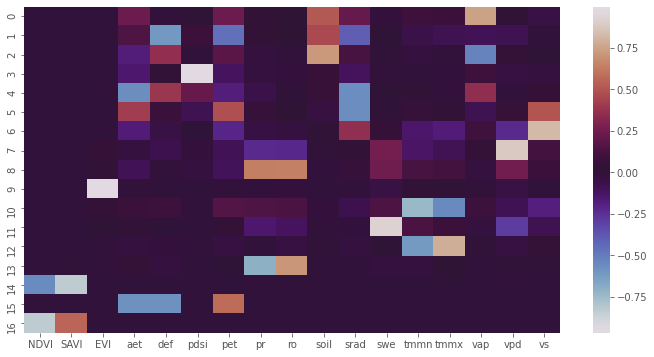

In [100]:
map= pd.DataFrame(pca.components_,columns=features)
plt.figure(figsize=(12,6))
sns.heatmap(map,cmap='twilight')

In [93]:
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
# ,'principal component 3', 'principal component 4',
#                           'principal component 5', 'principal component 6','principal component 7', 'principal component 8',
#                           'principal component 9', 'principal component 10'])

In [79]:
principalDf#.head(15)

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10
0,-4.669103,4.012873,1.878152,-0.507362,0.735074,0.085176,-0.117577,2.444316,-2.983833,0.169683
1,-5.651786,7.030749,3.077092,0.515544,-0.971863,-0.232203,0.482313,-2.180926,-1.510586,0.370856
2,-3.499437,2.639997,1.621518,-0.402427,0.709157,-1.111875,-0.233125,1.898610,-0.138785,0.401144
3,-3.521177,1.948274,5.364160,-0.966710,1.647069,-0.002209,-1.071610,2.731274,-1.694877,0.164729
4,-5.959501,7.572813,1.855459,0.312764,-0.612489,-0.185474,0.888329,-0.765104,-3.558675,0.474321
...,...,...,...,...,...,...,...,...,...,...
8704,2.253318,-2.072241,0.895494,-0.234365,0.401581,-1.182893,0.016745,-0.485235,-0.415225,0.134195
8705,1.713237,-1.715293,0.659944,-0.490440,0.921656,-2.301405,0.915724,-0.386168,-0.304423,0.490684
8706,1.930492,-2.607198,1.037927,-0.608820,1.047750,-1.135168,0.506061,-0.528316,-0.450899,0.215006
8707,2.398962,-2.256118,1.239543,-0.309842,0.510216,-1.101461,-0.094154,-0.472117,-0.392851,0.106577


In [65]:
principalDf.shape

(8709, 10)

In [86]:
newTarget = pd.DataFrame(merge_standardized_df['label'])#.reindex(principalDf.index)


newTarget.reset_index(drop=True, inplace=True)
newTarget
# df2.reset_index(drop=True, inplace=True)

# df = pd.concat( [df1, df2], axis=1) 

,label
0,0.0
1,0.0
2,0.0
3,1.0
4,0.0
...,...
8704,1.0
8705,1.0
8706,1.0
8707,1.0


In [94]:
finalDf = pd.concat([principalDf, newTarget], axis = 1).reindex(principalDf.index)
finalDf.head(15)

,principal component 1,principal component 2,label
0,3081.362030,1519.957146,0.0
1,2622.144197,1225.451539,0.0
2,2027.596702,753.461468,0.0
3,2811.200819,1260.520890,1.0
4,3151.277160,1823.029763,0.0
5,2196.942585,937.260945,1.0
6,1097.357147,8.770577,1.0
7,1065.983069,-12.693006,1.0
8,749.845417,-359.189259,0.0
9,3188.545988,1803.516578,0.0


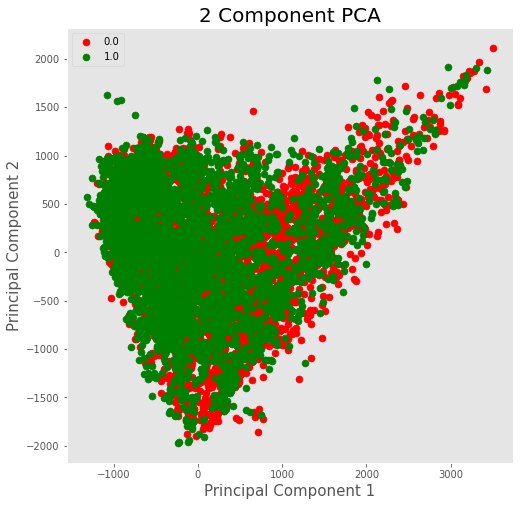

In [95]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = [0.0, 1.0]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['label'] == target
    ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1']
               , principalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

Component: 1: Variance: 0.3907421339409526 Total variance: 0.3907421339409526
Component: 2: Variance: 0.20575338893325087 Total variance: 0.5964955228742035
Component: 3: Variance: 0.12658420631441195 Total variance: 0.7230797291886154
Component: 4: Variance: 0.08966587431027374 Total variance: 0.8127456034988891
Component: 5: Variance: 0.04068325431398275 Total variance: 0.8534288578128719
Component: 6: Variance: 0.021501835965249617 Total variance: 0.8749306937781215
Component: 7: Variance: 0.019134202248615954 Total variance: 0.8940648960267374
Component: 8: Variance: 0.013542795890796383 Total variance: 0.9076076919175339
Component: 9: Variance: 0.010838240049185956 Total variance: 0.9184459319667199
Component: 10: Variance: 0.010291461723090973 Total variance: 0.9287373936898108
Component: 11: Variance: 0.007348720902204803 Total variance: 0.9360861145920156
Component: 12: Variance: 0.005554271266611598 Total variance: 0.9416403858586272
Component: 13: Variance: 0.0047680008235338

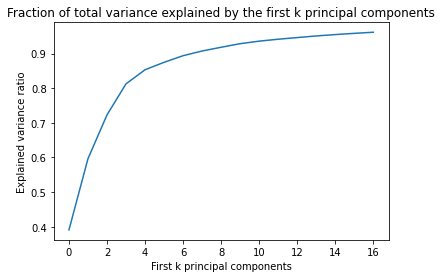

In [38]:
def P1():

    # define and initialize variables
    count = 0
    variance = 0

    pca = PCA(n_components=17)
    pca.fit(X_train)
    for i in pca.explained_variance_ratio_:
        count += 1
        variance += i
        print(f"Component: {count}: Variance: {i} Total variance: {variance}")

    plt.plot(np.cumsum(pca.explained_variance_ratio_))

    plt.ylabel('Explained variance ratio') 
    plt.xlabel('First k principal components')
    plt.title('Fraction of total variance explained by the first k principal components')  

  
P1()

In [40]:
y_train

array([1., 0., 0., ..., 0., 1., 1.])

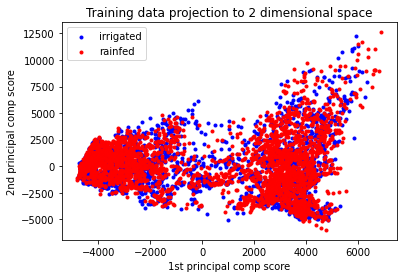

In [44]:
def P2():
    pca = PCA(n_components=2)
    train_data_2D = pca.fit_transform(X_train)

    train_data_irrigated_pca = train_data_2D[y_train == 1]
    train_data_rainfed_pca = train_data_2D[y_train == 0]
    irrigated = plt.scatter(train_data_irrigated_pca[:, 0], train_data_irrigated_pca[:, 1],facecolor='blue',marker=".")
    rainfed = plt.scatter(train_data_rainfed_pca[:, 0], train_data_rainfed_pca[:, 1],facecolor='red',marker=".")
    # Plot legends for scatterplot
    plt.legend((irrigated,rainfed),
           ('irrigated', 'rainfed'),
           scatterpoints=1,
           loc='upper left')
    plt.xlabel("1st principal comp score")
    plt.ylabel('2nd principal comp score')
    plt.title("Training data projection to 2 dimensional space")
    plt.show()
    
P2()

Gaussian Mixture Model

In [45]:
def computeParams(cov_matrix,n_pca,n_gmm,n_classes=2):
    '''Helper function to compute the total number of parameters'''
    
    if cov_matrix == 'full':
       return int(n_pca*n_gmm + n_pca * (n_pca + 1)/ 2 * n_gmm) * n_classes
    elif cov_matrix == 'diag': 
      return int(n_pca*n_gmm + n_pca * n_gmm) * n_classes
    elif cov_matrix == 'spherical': 
      return int(n_pca*n_gmm + n_gmm) * n_classes
    elif cov_matrix == 'tied': 
      return int(n_pca*n_gmm + (n_pca)**2) * n_classes

      return None

In [49]:
def P6():
  
    np.random.seed(20)

    accuracy_dict = {}

    n_com_pca = range(1,17)

    for n_pca in n_com_pca:
        mixture_components = range(1,17)
        pca = PCA(n_components=n_pca)
        train_data_nD = pca.fit_transform(X_train)
        test_data_nD = pca.transform(X_test)


        train_data_irrigated_pca_n = train_data_nD[y_train == 1]
        train_data_rainfed_pca_n = train_data_nD[y_train == 0]

        for mix in mixture_components:
          
            covariance_matrix = ['spherical', 'tied', 'diag', 'full']
            for cov_matrix in covariance_matrix:
                param_value = computeParams(cov_matrix,n_pca,mix,2)

                if (param_value > 0 and param_value < 17):
                    gmm_irrigated = GMM(n_components=mix, covariance_type=cov_matrix)
                    gmm_irrigated.fit(train_data_irrigated_pca_n)
                    pos_log_prob = gmm_irrigated.score_samples(test_data_nD)

                    gmm_rainfed = GMM(n_components=mix, covariance_type=cov_matrix)
                    gmm_rainfed.fit(train_data_rainfed_pca_n)
                    neg_log_prob = gmm_rainfed.score_samples(test_data_nD)
                    predictions  = pos_log_prob > neg_log_prob

                    # Calculate the prediction accuracy
                    accuracy = round(((y_test==predictions).sum())/len(y_test),4)*100
                    dict_key = str(n_pca)+","+str(mix)+","+cov_matrix+","+str(param_value)
                    accuracy_dict[dict_key] = accuracy

    temp = '|{0:10}|{1:15}|{2:18}|{3:10}|{4:12}|{5:8}|'

    # Sort the results dictionary from highest accuracy to smallest
    sorted_results = sorted(accuracy_dict, key=accuracy_dict.get, reverse=True)
    print(temp.format('Model Rank','PCA Components','Mixture Components','Covariance','Total Params','Accuracy'))
    print('-' * 96)

    for score_rank,item in enumerate(sorted_results):
        pca,gmm,cov,par = item.split(',')
        print(temp.format(score_rank+1,pca,gmm,cov,int(float(par)),round(accuracy_dict[item],3)))

P6()

|Model Rank|PCA Components |Mixture Components|Covariance|Total Params|Accuracy|
------------------------------------------------------------------------------------------------
|         1|4              |1                 |diag      |          16|   57.52|
|         2|2              |2                 |tied      |          16|   56.72|
|         3|1              |2                 |spherical |           8|   56.18|
|         4|1              |2                 |diag      |           8|   56.18|
|         5|1              |2                 |full      |           8|   56.18|
|         6|1              |4                 |spherical |          16|   56.14|
|         7|1              |5                 |tied      |          12|   56.07|
|         8|1              |1                 |spherical |           4|   56.03|
|         9|1              |1                 |tied      |           4|   56.03|
|        10|1              |1                 |diag      |           4|   56.03|
|        11|

MLP Classifier

In [50]:
from sklearn.neural_network import MLPClassifier

In [55]:
mlp = MLPClassifier(solver='lbfgs', alpha=1e-5,
                     hidden_layer_sizes=(5, 2), random_state=1)

mlp.fit(X_train, y_train)
mlp.predict(X_test)

array([1., 1., 1., ..., 1., 1., 1.])

In [56]:
print("Training set score: %f" % mlp.score(X_train, y_train))
print("Test set score: %f" % mlp.score(X_test, y_test))

Training set score: 0.480643
Test set score: 0.480674


In [60]:
X_train.shape

(6096, 204)

In [57]:
from sklearn.decomposition import PCA
pca = PCA(0.99, whiten=True)
data = pca.fit_transform(X_train)
data.shape

(6096, 38)

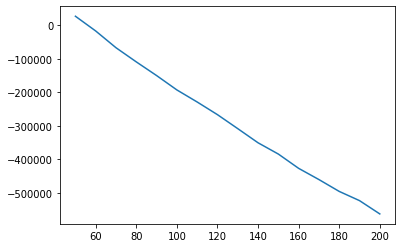

In [62]:
n_components = np.arange(50, 210, 10)
models = [GMM(n, covariance_type='full', random_state=0)
          for n in n_components]
aics = [model.fit(data).aic(data) for model in models]
plt.plot(n_components, aics);

###Angela's code

In [24]:
merge_standardized_df = merge_raw_df2.copy()
feature_lst = ['NDVI', 'aet', 'def', 'pdsi', 'pet', 'pr', 'ro', 'soil', 'srad', 'swe', 'tmmn', 'tmmx', 'vap', 'vpd', 'vs']
first_ind = 0
feature_mean_lst = []
feature_std_lst = []
for feat in feature_lst:
    temp_df = merge_raw_df.loc[:, merge_raw_df.columns.str.contains(feat)]
    feature_mean = temp_df.mean().mean()
    feature_mean_lst.append(feature_mean)
    feature_std = temp_df.stack().std()
    feature_std_lst.append(feature_std)
    for col in list(temp_df.columns):
        merge_standardized_df[col] = (temp_df[col]-feature_mean)/feature_std

In [20]:
with open(angela_project_pathname + 'Model_prep_mean.csv', 'wt') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(feature_mean_lst)
with open(angela_project_pathname + 'Model_prep_std.csv', 'wt') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(feature_std_lst)

In [25]:
merge_standardized_df.head()

,201801_NDVI,201802_NDVI,201803_NDVI,201804_NDVI,201805_NDVI,201806_NDVI,201807_NDVI,201808_NDVI,201809_NDVI,201810_NDVI,201811_NDVI,201812_NDVI,country_segment_code,landcover,lat,lon,label,201801_aet,201801_def,201801_pdsi,201801_pet,201801_pr,201801_ro,201801_soil,201801_srad,201801_swe,201801_tmmn,201801_tmmx,201801_vap,201801_vpd,201801_vs,201802_aet,201802_def,201802_pdsi,201802_pet,201802_pr,201802_ro,201802_soil,201802_srad,201802_swe,...,201810_pdsi,201810_pet,201810_pr,201810_ro,201810_soil,201810_srad,201810_swe,201810_tmmn,201810_tmmx,201810_vap,201810_vpd,201810_vs,201811_aet,201811_def,201811_pdsi,201811_pet,201811_pr,201811_ro,201811_soil,201811_srad,201811_swe,201811_tmmn,201811_tmmx,201811_vap,201811_vpd,201811_vs,201812_aet,201812_def,201812_pdsi,201812_pet,201812_pr,201812_ro,201812_soil,201812_srad,201812_swe,201812_tmmn,201812_tmmx,201812_vap,201812_vpd,201812_vs
1,-0.479873,-0.282284,-0.237369,0.241782,-0.576104,-0.739452,0.302756,0.773048,1.327450,1.431351,1.207809,1.329457,KHM_0,3,12.517,105.373,0.0,0.376152,-0.212298,0.932124,0.029528,-0.706703,-0.300526,4.460365,0.032110,-0.237908,0.934733,0.666980,1.419009,-0.303133,-1.302106,0.460235,0.009784,0.858437,0.323010,-0.706703,-0.300526,3.551189,0.933216,-0.237908,...,0.047885,0.535585,1.184109,-0.008595,6.649622,0.904237,-0.237908,1.216571,0.813849,2.152002,-0.107201,-1.479391,1.149246,-0.561072,-0.062645,0.183407,0.013607,-0.237969,6.099292,0.388137,-0.237908,1.163727,0.813849,1.933773,0.121386,-1.390748,0.586359,-0.262975,-0.025801,0.118366,-0.668115,-0.279674,5.155439,0.058329,-0.237908,1.110882,0.797531,1.768175,0.143156,-1.036179
2,1.867232,1.595813,1.331167,1.076423,1.717627,0.817969,-0.548237,-0.652149,0.552810,1.083482,0.872847,0.832295,KHM_0,4,12.280,102.655,0.0,1.408502,-0.818926,2.221638,0.085051,0.605289,-0.175413,2.886270,-0.242499,-0.237908,1.084460,0.756733,1.634671,-0.216052,-0.681610,0.703140,-0.191432,2.111109,0.273832,-0.449449,-0.279674,2.109777,0.679306,-0.237908,...,1.521616,0.384879,3.152098,3.390310,4.062318,0.477834,-0.237908,1.216571,0.854646,2.131463,-0.172512,-1.124821,0.985752,-0.508905,1.190027,0.127884,-0.166471,-0.237969,3.421523,0.208744,-0.237908,1.154919,0.903603,1.878574,-0.009235,-1.479391,0.672777,-0.240618,1.153183,0.200858,-0.565213,-0.279674,2.536472,-0.196961,-0.237908,1.181342,0.928081,1.777161,0.110501,-0.592967
4,0.810523,0.088876,-0.461016,-0.540054,-0.138716,0.598715,-0.703709,-0.334411,1.543470,-0.401321,-0.045932,0.176011,KHM_0,5,11.684,104.242,0.0,0.429871,-0.422457,1.300557,-0.157666,-0.410861,-0.258821,1.966541,-0.267338,-0.237908,1.075652,0.658821,1.530691,-0.488180,-1.745318,0.350460,-0.015555,1.337400,0.221481,-0.680977,-0.279674,1.158385,0.581330,-0.237908,...,0.711064,0.369015,1.621440,0.929753,3.344627,0.636528,-0.237908,1.225379,0.748574,2.104505,-0.303133,-1.568033,1.179610,-0.714592,0.563691,0.040633,0.270860,-0.217117,3.062677,0.143886,-0.237908,1.198956,0.764893,1.855467,-0.237822,-1.568033,0.488262,-0.416495,0.600534,-0.111661,-0.513763,-0.279674,2.349510,-0.245259,-0.237908,1.198956,0.764893,1.818240,-0.357559,-1.568033
7,-1.350348,-0.956977,-0.573143,-1.249977,-0.901362,-1.428536,-1.897891,-2.147297,-1.455186,-3.416567,-3.326762,-2.103421,KHM_0,2,12.460,104.924,1.0,0.366809,-0.222732,1.153183,0.012078,-0.680977,-0.279674,3.738151,0.016931,-0.237908,0.996385,0.683299,1.461371,-0.368444,-1.479391,0.415858,0.029160,1.079497,0.313491,-0.719565,-0.300526,2.841038,0.916657,-0.237908,...,0.637378,0.538758,1.338461,0.241631,5.781156,0.872499,-0.237908,1.260609,0.830168,2.189229,-0.107201,-1.479391,1.160925,-0.574486,0.526848,0.177062,0.039332,-0.237969,5.254950,0.350878,-0.237908,1.216571,0.846487,1.959447,0.099616,-1.479391,0.567674,-0.318123,0.490004,0.046978,-0.590939,-0.279674,4.403070,0.025211,-0.237908,1.163727,0.822009,1.792566,0.154041,-1.479391
20,0.930570,1.503744,1.225845,1.325926,1.963657,0.911215,0.075750,1.528966,2.303226,2.188087,2.133167,2.062616,MMR_0,5,12.095,99.045,0.0,0.443885,-0

In [26]:
merge_standardized_df['label'].value_counts()

0.0    4523
1.0    4186
Name: label, dtype: int64

LSTM

In [15]:
x_columns = list(merge_standardized_df.columns)
x_columns.remove('country_segment_code')
x_columns.remove('landcover')
x_columns.remove('label')
x_columns.remove('lat')
x_columns.remove('lon')
x_columns.sort()

In [ ]:
x_columns

['201801_NDVI',
 '201801_aet',
 '201801_def',
 '201801_pdsi',
 '201801_pet',
 '201801_pr',
 '201801_ro',
 '201801_soil',
 '201801_srad',
 '201801_swe',
 '201801_tmmn',
 '201801_tmmx',
 '201801_vap',
 '201801_vpd',
 '201801_vs',
 '201802_NDVI',
 '201802_aet',
 '201802_def',
 '201802_pdsi',
 '201802_pet',
 '201802_pr',
 '201802_ro',
 '201802_soil',
 '201802_srad',
 '201802_swe',
 '201802_tmmn',
 '201802_tmmx',
 '201802_vap',
 '201802_vpd',
 '201802_vs',
 '201803_NDVI',
 '201803_aet',
 '201803_def',
 '201803_pdsi',
 '201803_pet',
 '201803_pr',
 '201803_ro',
 '201803_soil',
 '201803_srad',
 '201803_swe',
 '201803_tmmn',
 '201803_tmmx',
 '201803_vap',
 '201803_vpd',
 '201803_vs',
 '201804_NDVI',
 '201804_aet',
 '201804_def',
 '201804_pdsi',
 '201804_pet',
 '201804_pr',
 '201804_ro',
 '201804_soil',
 '201804_srad',
 '201804_swe',
 '201804_tmmn',
 '201804_tmmx',
 '201804_vap',
 '201804_vpd',
 '201804_vs',
 '201805_NDVI',
 '201805_aet',
 '201805_def',
 '201805_pdsi',
 '201805_pet',
 '201805_pr

In [16]:
x_df = merge_standardized_df[x_columns]
y_df = merge_standardized_df['label']
X_train, X_test, y_train, y_test = train_test_split(x_df.values, y_df.values, test_size=0.3, random_state=210, stratify=y_df.values)
X_train2 = np.transpose(X_train.reshape(X_train.shape[0], 15, 12), axes=[0, 2, 1])
X_test2 = np.transpose(X_test.reshape(X_test.shape[0], 15, 12), axes=[0, 2, 1])
# y_01_arr = to_categorical(y_arr)

In [17]:
# define model
model = Sequential()
# model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(12, 17)))
# model.add(LSTM(50, activation='relu'))
model.add(LSTM(50, activation='relu', input_shape=(12, 15)))
model.add(Dropout(0.3))
# model.add(Dense(20, activation='relu'))
# model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))
opt = Adam(learning_rate=0.001)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 50)                13200     
_________________________________________________________________
dropout_1 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 51        
Total params: 13,251
Trainable params: 13,251
Non-trainable params: 0
_________________________________________________________________


In [18]:
history = model.fit(X_train2, y_train, validation_data=(X_test2, y_test), epochs=30, batch_size=16)

Train on 6096 samples, validate on 2613 samples
Epoch 1/30
6096/6096 [==============================] - 4s 621us/step - loss: 0.6854 - accuracy: 0.5523 - val_loss: 0.6673 - val_accuracy: 0.5771
Epoch 2/30
6096/6096 [==============================] - 3s 501us/step - loss: 0.6719 - accuracy: 0.5810 - val_loss: 0.6576 - val_accuracy: 0.6043
Epoch 3/30
6096/6096 [==============================] - 3s 496us/step - loss: 0.6668 - accuracy: 0.5889 - val_loss: 0.6558 - val_accuracy: 0.5951
Epoch 4/30
6096/6096 [==============================] - 3s 509us/step - loss: 0.6562 - accuracy: 0.6060 - val_loss: 0.6517 - val_accuracy: 0.6123
Epoch 5/30
6096/6096 [==============================] - 3s 477us/step - loss: 0.6474 - accuracy: 0.6166 - val_loss: 0.6423 - val_accuracy: 0.6330
Epoch 6/30
6096/6096 [==============================] - 3s 477us/step - loss: 0.6427 - accuracy: 0.6243 - val_loss: 0.6393 - val_accuracy: 0.6303
Epoch 7/30
6096/6096 [==============================] - 3s 492us/step - loss

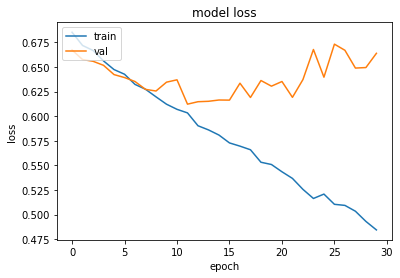

In [19]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

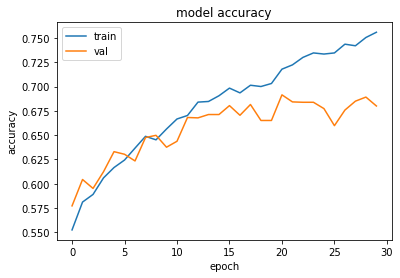

In [20]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# model.save('Model_LSTM.h5')

In [21]:
predictions = model.predict(x_arr[:3])

NameError: ignored

GBM

In [22]:
clf = GradientBoostingClassifier(random_state=0)
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.6754688097971681

In [ ]:
clf.predict(X_test[:2])

array([1., 0.])

In [ ]:
# Save to file in the current working directory
pkl_filename = "Model_GBM.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(clf, file)

# Load from file
with open(pkl_filename, 'rb') as file:
    pickle_model = pickle.load(file)
    
# Calculate the accuracy score and predict target values
score = pickle_model.score(X_test, y_test)
print("Test score: {0:.2f} %".format(100 * score))
# Ypredict = pickle_model.predict(X_test)

Test score: 67.55 %


Random Forest

In [ ]:
clf = RandomForestClassifier(max_depth=20, criterion="entropy", min_samples_split=10, min_samples_leaf=5, 
                             max_samples=0.5, max_features=10, n_estimators=100, random_state=0)
# clf = RandomForestClassifier(max_depth=20, criterion="entropy", min_samples_split=10, min_samples_leaf=5, 
#                              random_state=0)
clf.fit(X_train, y_train)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

0.8987860892388452
0.7129735935706085


In [ ]:
clf.predict(X_test[:2])

array([0., 0.])

In [ ]:
# Save to file in the current working directory
pkl_filename = "Model_RF.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(clf, file)

# Load from file
with open(pkl_filename, 'rb') as file:
    pickle_model = pickle.load(file)
    
# Calculate the accuracy score and predict target values
score = pickle_model.score(X_test, y_test)
print("Test score: {0:.2f} %".format(100 * score))
# Ypredict = pickle_model.predict(X_test)

Test score: 71.30 %


Logistic Regression

In [ ]:
clf = LogisticRegression(random_state=0)
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

/usr/local/lib/python3.5/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.6410256410256411

In [ ]:
clf.predict(X_test[:2])

array([0., 1.])